In [1]:
import numpy as np
import matplotlib.pyplot as plt

# Problem 3
#### Kalman Filter

In [2]:
# Kalman Filter functions
def calculate_x(A,B,x,u):
    return np.dot(A,x) + np.dot(B,u)

def calculate_s(A,S,W):
    return np.dot(A,np.dot(S,A.T)) + W

def calculate_gain(S,H,V):
    step = H @ S @ H.T + V
    return S @ H.T @ np.linalg.inv(step)

def get_x_hat(x,L,z,H):
    return x + np.dot(L,z - np.dot(H,x))

def get_s_hat(L,H,S):
    return (np.eye(L.shape[0]) - np.dot(L,H)) @ S

# One iteration of the Kalman filter
def iterate(A,B,H,V,W,S0,x0,u0,z0):
    # Predict
    x_cond = calculate_x(A,B,x0,u0)
    S_cond = calculate_s(A,S0,W)

    # Update
    L = calculate_gain(S_cond,H,V)
    x_new = get_x_hat(x_cond,L,z0,H)
    S_new = get_s_hat(L,H,S_cond)
    return x_new,S_new

def kalman_no_control(A,B,H,V,W,S0,x0,T):
    # Initialize the true state and observation
    x_true = [x0]
    z = [np.dot(H,x_true[-1]) + np.random.multivariate_normal(np.zeros(H.shape[0]), V)]
    
    # Initialize the predicted first state
    x_pred = [x0]
    S = [S0]
    u0 = np.zeros(B.shape[1])

    # Iterate
    for i in range(T):
        # Generate the next state and observation
        x_true.append(np.dot(A,x_true[-1]) + np.random.multivariate_normal(np.zeros(A.shape[0]), W))
        z.append(np.dot(H,x_true[-1]) + np.random.multivariate_normal(np.zeros(H.shape[0]), V))

        # Predict the next state
        x_next,S_next = iterate(A,B,H,V,W,S[-1], x_pred[-1],u0,z[-1])
        x_pred.append(x_next)
        S.append(S_next)

    # Return the true state, predicted state, covariance, and observation
    return x_true,x_pred, S, z

#### Costate equations

In [3]:
# Define functions to get the costate and kalman gain
def calcluate_p_next(P,A,B,R,Q):
    return A.T @ P @ A + Q - A.T @ P @ B @ np.linalg.inv(R + B.T @ P @ B) @ B.T @ P @ A

def calculate_k_matrix(P,A,B,R):
    return -np.linalg.inv(R + B.T @ P @ B) @ B.T @ P @ A

# Calculate the control for the Kalman filter
def get_gain(A,B,R,Q,M,T):
    P = [M]
    K = [calculate_k_matrix(P[-1],A,B,R)]

    # Iterate to get the control
    for i in range(T):
        P.append(calcluate_p_next(P[-1],A,B,R,Q))
        K.append(calculate_k_matrix(P[-1],A,B,R))

    # Return the control
    return K[::-1]

#### LQG Implementation

In [4]:
def LQG(A,B,H,V,W,S0,x0,T,M,R,Q):
    # Get our control matrices
    K_matrices = get_gain(A,B,R,Q,M,T)

    # Initialize the true state and observation
    x_true = [x0]
    z = [np.dot(H,x_true[-1]) + np.random.multivariate_normal(np.zeros(H.shape[0]), V)]
    
    # Initialize the predicted first state
    x_pred = [x0]
    S = [S0]
    control = []

    # Iterate
    for i in range(T):
        # Calculate the control
        control.append(K_matrices[i] @ x_pred[-1])

        # Generate the next state and observation
        w_i = np.random.multivariate_normal(np.zeros(A.shape[0]), W)
        v_i = np.random.multivariate_normal(np.zeros(H.shape[0]), V)
        x_true.append(A @ x_true[-1] + B @ control[-1] + w_i)
        z.append(np.dot(H,x_true[-1]) + v_i)

        # Predict the next state
        x_next,S_next = iterate(A,B,H,V,W,S[-1], x_pred[-1],K_matrices[i] @ x_pred[-1],z[-1])
        x_pred.append(x_next)
        S.append(S_next)

    control.append(K_matrices[-1] @ x_pred[-1])
    # Return the true state, predicted state, covariance, and observation
    return x_true,x_pred, S, z, control

### Define Model Parameters

In [5]:
# Define our intial condition and system dynamics
x0 = np.array([-10,20,30,0,0,0])
A = np.eye(6)
A[0,3], A[1,4], A[2,5] = .1,.1,.1
B = np.zeros((6,3))
B[3:] = np.eye(3)

# Define our observation matrix
H = np.zeros((3,6))
H[:,:3] = np.eye(3)

# Define our covariance matrices
V = np.eye(3)*.5
W = np.eye(6)*.05

# Define other miscellaneous variables
T = 100
S0 = np.zeros((6,6)) # We assume we know the initial state

In [6]:
# Define our cost function variables
M = np.eye(6)
R = np.eye(3)*12
Q = np.eye(6)
Q[3:,3:] = np.eye(3)*.1

### Run the model

In [7]:
# Run the Kalman filter
x_true,x_pred,S, z, control = LQG(A,B,H,V,W,S0,x0,T,M,R,Q)

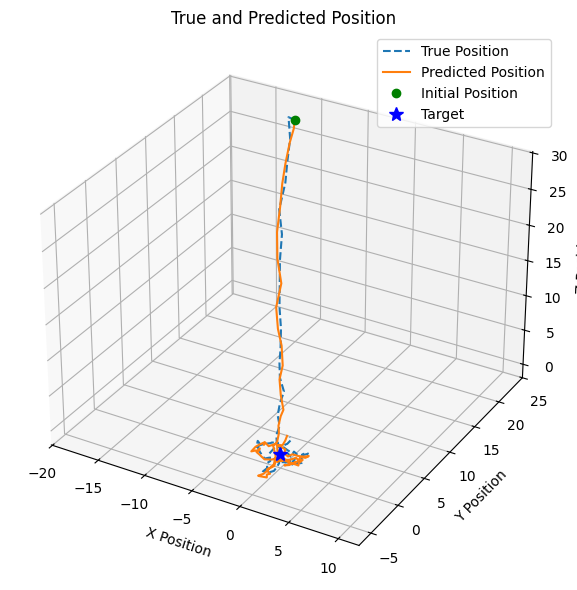

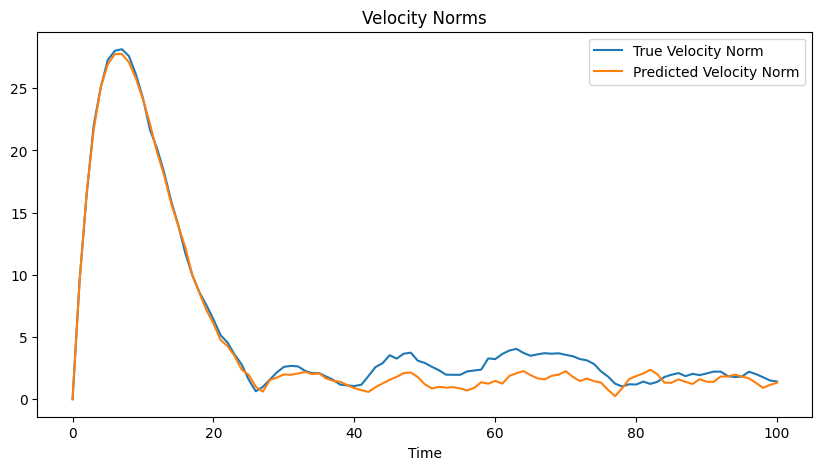

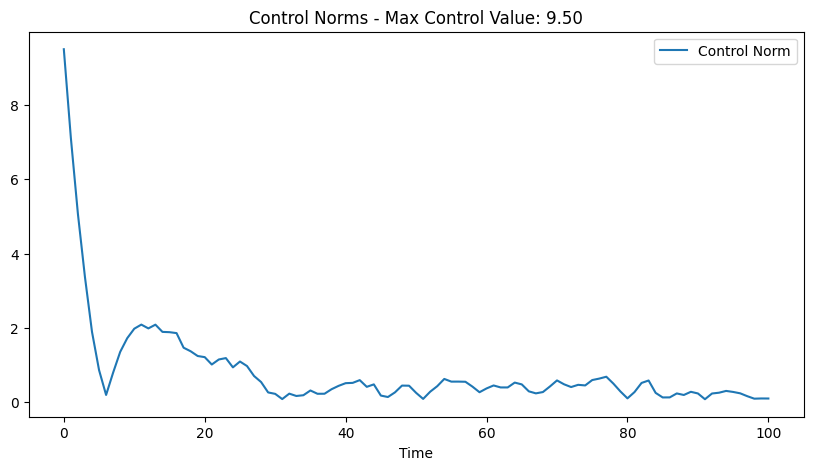

Max Control Value: 9.497534586399558


In [8]:
# Get the position and velocity of the true and predicted states
true_position = np.array(x_true).T[:3]
pred_position = np.array(x_pred).T[:3]
true_velocity = np.array(x_true).T[3:]
pred_velocity = np.array(x_pred).T[3:]

# Get the norms of the velocities and the control values
true_velocity_norms = np.linalg.norm(true_velocity,axis=0)
pred_velocity_norms = np.linalg.norm(pred_velocity,axis=0)
control_vals = np.array(control).T
control_norms = np.linalg.norm(control_vals,axis=0)

fig = plt.figure(figsize=(6,6))
ax = fig.add_subplot(111, projection='3d')
ax.plot(true_position[0],true_position[1],true_position[2],label='True Position', linestyle='--')
ax.plot(pred_position[0],pred_position[1],pred_position[2],label='Predicted Position')

# Add initial position and target
ax.plot(x0[0],x0[1],x0[2],'go',label='Initial Position')
ax.plot([0],[0],[0],'b*',label='Target', markersize=10)

# Setting the aspect ratio
max_range = np.array([true_position[0].max()-true_position[0].min(), true_position[1].max()-true_position[1].min(), true_position[2].max()-true_position[2].min()]).max()
Xb = 0.5*max_range*np.mgrid[-1:2:2, -1:2:2, -1:2:2][0].flatten() + 0.5*(true_position[0].max()+true_position[0].min())
Yb = 0.5*max_range*np.mgrid[-1:2:2, -1:2:2, -1:2:2][1].flatten() + 0.5*(true_position[1].max()+true_position[1].min())
Zb = 0.5*max_range*np.mgrid[-1:2:2, -1:2:2, -1:2:2][2].flatten() + 0.5*(true_position[2].max()+true_position[2].min())
ax.set_xlim([Xb.min(), Xb.max()])
ax.set_ylim([Yb.min(), Yb.max()])
ax.set_zlim([Zb.min(), Zb.max()])

# Label the axis and add a legend
ax.set_title('True and Predicted Position')
ax.set_xlabel('X Position')
ax.set_ylabel('Y Position')
ax.set_zlabel('Z Position')
ax.legend()
plt.tight_layout()
plt.show()

# Plot the velocity and control values
plt.figure(figsize=(10,5))
plt.plot(true_velocity_norms,label='True Velocity Norm')
plt.plot(pred_velocity_norms,label='Predicted Velocity Norm')
plt.legend()
plt.xlabel('Time')
plt.title('Velocity Norms')
plt.show()

# Plot the control values
plt.figure(figsize=(10,5))
plt.plot(control_norms,label='Control Norm')
plt.legend()
plt.title('Control Norms - Max Control Value: {:.2f}'.format(np.max(control_norms)))
plt.xlabel('Time')
plt.show()

# Print the max control value
print('Max Control Value:',np.max(control_norms))

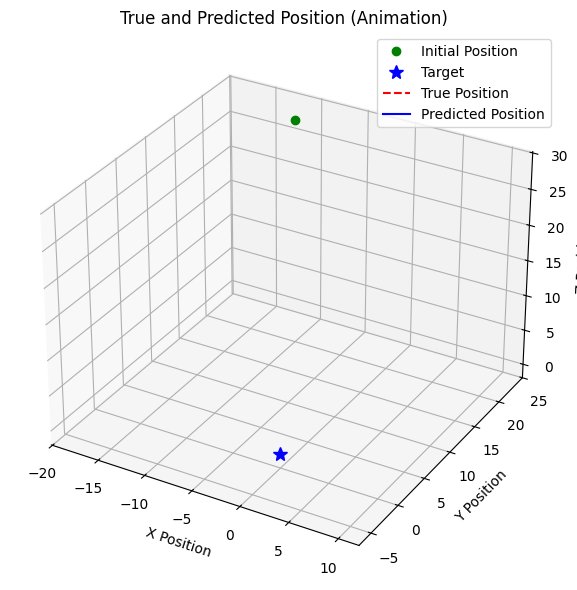

In [9]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# Ensure you have your data defined beforehand:
# x_true, x_pred, x0, control, etc.

# Example data references (replace with your actual data):
# true_position = np.array(x_true).T[:3]
# pred_position = np.array(x_pred).T[:3]

# -- Start of Animation Code --

# Create the figure and a 3D axis
fig = plt.figure(figsize=(6,6))
ax = fig.add_subplot(111, projection='3d')

# Plot static points (initial state & target).
# We'll animate the lines for the trajectory, not these points.
ax.plot(x0[0], x0[1], x0[2], 'go', label='Initial Position')
ax.plot([0], [0], [0], 'b*', label='Target', markersize=10)

# Create empty line objects that we will update in the animation.
line_true, = ax.plot([], [], [], 'r--', label='True Position')
line_pred, = ax.plot([], [], [], 'b',   label='Predicted Position')

# Set up axis limits using the same logic as before to get equal aspect ratio
max_range = np.array([true_position[0].max()-true_position[0].min(),
                      true_position[1].max()-true_position[1].min(),
                      true_position[2].max()-true_position[2].min()]).max()
Xb = 0.5*max_range*np.mgrid[-1:2:2, -1:2:2, -1:2:2][0].flatten() + \
     0.5*(true_position[0].max() + true_position[0].min())
Yb = 0.5*max_range*np.mgrid[-1:2:2, -1:2:2, -1:2:2][1].flatten() + \
     0.5*(true_position[1].max() + true_position[1].min())
Zb = 0.5*max_range*np.mgrid[-1:2:2, -1:2:2, -1:2:2][2].flatten() + \
     0.5*(true_position[2].max() + true_position[2].min())

ax.set_xlim([Xb.min(), Xb.max()])
ax.set_ylim([Yb.min(), Yb.max()])
ax.set_zlim([Zb.min(), Zb.max()])

ax.set_title('True and Predicted Position (Animation)')
ax.set_xlabel('X Position')
ax.set_ylabel('Y Position')
ax.set_zlabel('Z Position')
ax.legend()
plt.tight_layout()

# Number of frames is determined by how many time steps you have
num_frames = true_position.shape[1]  # e.g., if true_position is 3 x T

def init():
    """
    Initialize the animated lines with empty data.
    This function will be called once.
    """
    line_true.set_data([], [])
    line_true.set_3d_properties([])
    line_pred.set_data([], [])
    line_pred.set_3d_properties([])
    return line_true, line_pred

def update(frame):
    """
    Update the line objects for each frame.
    """
    # Draw up to the current frame index
    line_true.set_data(true_position[0, :frame], true_position[1, :frame])
    line_true.set_3d_properties(true_position[2, :frame])
    
    line_pred.set_data(pred_position[0, :frame], pred_position[1, :frame])
    line_pred.set_3d_properties(pred_position[2, :frame])
    
    return line_true, line_pred

# Create the animation
anim = animation.FuncAnimation(
    fig,        # The figure object
    update,     # The function that updates the data each frame
    init_func=init,
    frames=num_frames, 
    interval=100,     # Time in ms between frames (adjust to speed up/down)
    blit=False        # For 3D lines, often safer to use blit=False
)

# Display the animation inline in a Jupyter notebook
HTML(anim.to_jshtml())
